In [1]:
import pandas as pd
import numpy as np
import datetime as dt

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [3]:
# data_USED_CAR = pd.read_excel("data.xlsx", sheet_name="USED_CAR")
data_NEW_CAR = pd.read_excel("data.xlsx", sheet_name="NEW_CAR")
# print (data_USED_CAR.shape)
print (data_NEW_CAR.shape)

(7128, 12)


In [4]:
data_NEW_CAR.head()

,CUSTOMERID,VEHICLEID,TRANSACTION_DATE,BRAND,MODEL,COLOUR,ACTUAL_PRICE,DISCOUNTED RATIO,MODELYR,STORECODE,CUS_BIRTH_DATE,GENDER
0,0,368748,2001-07-18,G,SUBURBAN,Indigo Blue/lw. Gold,13240.87803,0.000000,2001,70,NaN,M
1,0,565856,2004-06-15,G,BLAZER,Silver Green Metalli,10537.45200,0.000000,2004,85,94/08/26 00:00:00,M
2,0,498561,2003-10-05,H,CAPRICE,BERRY RED,11391.84000,0.000000,2004,51,90/09/10 00:00:01,M
3,17,492653,2003-08-25,H,CAPRICE,Quick Silver,8793.07650,-0.010693,2004,55,73/12/12 00:00:00,M
4,17,504038,2003-08-20,H,CAPRICE,WHITE,8793.07650,-0.003349,2004,70,88/08/16 00:00:00,F


In [5]:
data_NEW_CAR.dtypes

CUSTOMERID            int64
VEHICLEID             int64
TRANSACTION_DATE     object
BRAND                object
MODEL                object
COLOUR               object
ACTUAL_PRICE        float64
DISCOUNTED RATIO    float64
MODELYR               int64
STORECODE             int64
CUS_BIRTH_DATE       object
GENDER               object
dtype: object

In [6]:
data_NEW_CAR['TRANSACTION_DATE'] = data_NEW_CAR['TRANSACTION_DATE'].str.replace("00", "01")
data_NEW_CAR['TRANSACTION_DATE'] = data_NEW_CAR['TRANSACTION_DATE'].str.replace("-02-29", "-02-28")

data_NEW_CAR['TRANSACTION_DATE_1'] = pd.to_datetime(data_NEW_CAR['TRANSACTION_DATE'], format='%Y-%m-%d')

data_NEW_CAR.head()



In [9]:
data_NEW_CAR.dtypes

CUSTOMERID                     int64
VEHICLEID                      int64
TRANSACTION_DATE              object
BRAND                         object
MODEL                         object
COLOUR                        object
ACTUAL_PRICE                 float64
DISCOUNTED RATIO             float64
MODELYR                        int64
STORECODE                      int64
CUS_BIRTH_DATE                object
GENDER                        object
TRANSACTION_DATE_1    datetime64[ns]
dtype: object

In [11]:
data_NEW_CAR_1 = data_NEW_CAR[data_NEW_CAR['CUS_BIRTH_DATE'].str.contains("/", na=False)]
data_NEW_CAR_1['CUS_BIRTH_DATE_1'] = pd.to_datetime(data_NEW_CAR_1['CUS_BIRTH_DATE'], format='%y/%m/%d %H:%M:%S')

data_NEW_CAR_2 = data_NEW_CAR[~data_NEW_CAR['CUS_BIRTH_DATE'].str.contains("/", na=False)]


data_NEW_CAR_2['CUS_BIRTH_DATE'] = np.where(data_NEW_CAR_2['CUS_BIRTH_DATE']=='en', np.NAN, data_NEW_CAR_2['CUS_BIRTH_DATE'])
print (data_NEW_CAR_2[data_NEW_CAR_2['CUS_BIRTH_DATE'] == 'en'].shape)

data_NEW_CAR_2['CUS_BIRTH_DATE_1'] = pd.to_datetime(data_NEW_CAR_2['CUS_BIRTH_DATE'], format='%Y-%m-%d %H:%M:%S')
data_NEW_CAR_2.shape

data_NEW_CAR_new = pd.concat([data_NEW_CAR_1,data_NEW_CAR_2], axis=0)

data_NEW_CAR_new.reset_index(inplace=True)

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [12]:
data_NEW_CAR_new

CUSTOMERID                     int64
VEHICLEID                      int64
TRANSACTION_DATE              object
BRAND                         object
MODEL                         object
COLOUR                        object
ACTUAL_PRICE                 float64
DISCOUNTED RATIO             float64
MODELYR                        int64
STORECODE                      int64
CUS_BIRTH_DATE                object
GENDER                        object
TRANSACTION_DATE_1    datetime64[ns]
CUS_BIRTH_DATE_1      datetime64[ns]
dtype: object

In [ ]:
data_NEW_CAR_new.shape

In [13]:
data_NEW_CAR_new.head()

(1244, 13)

In [21]:
###########################################################################################################

In [24]:
###########################################################

In [25]:
data_NEW_CAR_new["CUSTOMERID"].value_counts()

4591       712
578497     279
613        140
17         113
1229949     93
2509989     73
644052      70
2971736     67
3139479     64
189453      64
2993960     56
796         56
673550      53
25          48
837168      42
1276567     41
718521      41
729217      39
1443155     39
691979      34
2333942     29
3275139     27
1241470     25
78          22
3419582     21
1442757     21
1446383     20
387687      19
577514      19
387096      18
1188662     15
409882      14
1230502     14
3557963     13
387547      12
1673075     12
3615172     11
1026389     10
2962        10
2680278     10
3662432     10
386633       9
2562582      9
273244       9
618493       9
1345964      9
1150391      9
218277       8
2877268      8
1295674      8
901469       8
1242675      8
2560         7
583687       7
1254727      7
1212324      7
3368836      7
3034197      7
528895       6
3648336      6
529003       6
1209150      6
1315164      6
1150040      6
2429720      6
555222       6
1381918   

In [26]:
data_NEW_CAR_new["BRAND"].value_counts()

G    2558
H    2503
C     903
D     798
K     176
O      95
T      44
A      15
M      13
B       9
S       9
E       5
Name: BRAND, dtype: int64

In [27]:
data_NEW_CAR_new["COLOUR"].value_counts()

WHITE                              787
Black                              494
Summit White                       444
Quick Silver                       247
Bright White                       223
Olympic White                      213
PHANTOM BLACK                      179
Silver Ice Metallic                176
Champagne Silver Metallic          144
Tungsten Silver                    139
Light Pewter                       130
MARTINI GRAY                       120
Botanica Dark Blue                 107
TURBINE GREY                        99
Galaxy White                        89
Sandstone Metallic                  82
Mocha Steel Metallic                77
Orion Dark Gray                     73
Capricorn Dark Green                64
Brownstone Metallic                 63
Indigo Blue                         61
Tungsten Metallic                   61
Phantom Black Metallic              56
White Diamond                       54
Amazon Dark Blue                    50
Poly Silver              

In [28]:
data_NEW_CAR_new["ACTUAL_PRICE"].plot.hist(bins=10, alpha=0.5)
# import matplotlib.pyplot as plt
# plt.hist(data_USED_CAR_new_1["ACTUAL_PRICE"].astype('float'))
# plt.show()

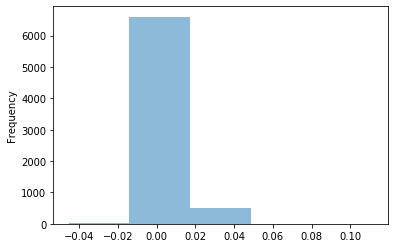

In [29]:
data_NEW_CAR_new["DISCOUNTED RATIO"].plot.hist(bins=5, alpha=0.5)


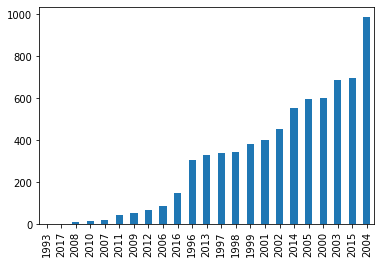

In [30]:
data_NEW_CAR_new["MODELYR"].value_counts().sort_values().plot(kind = 'bar')



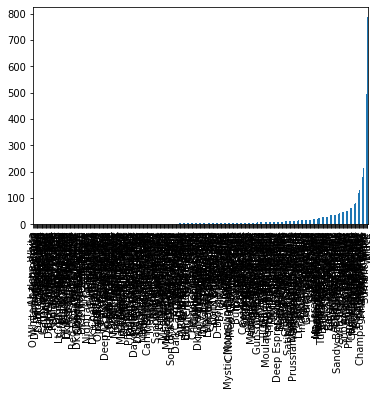

In [31]:
data_NEW_CAR_new["COLOUR"].value_counts().sort_values().plot(kind = 'bar')


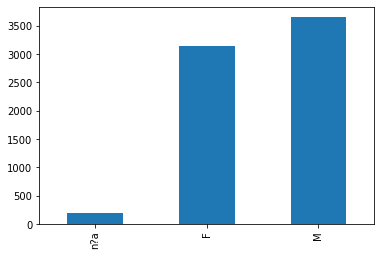

In [32]:
data_NEW_CAR_new["GENDER"].value_counts().sort_values().plot(kind = 'bar')


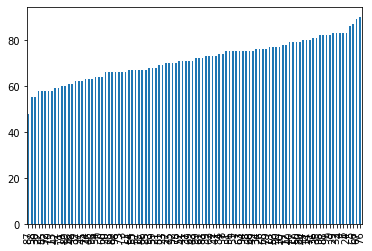

In [33]:
data_NEW_CAR_new["STORECODE"].value_counts().sort_values().plot(kind = 'bar')


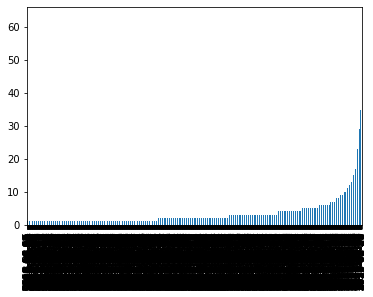

In [34]:

data_NEW_CAR_new["TRANSACTION_DATE"].value_counts().sort_values().plot(kind = 'bar')


In [35]:
data_NEW_CAR_new["CUS_BIRTH_DATE"].value_counts()


2020-01-09 00:00:00    11
2027-01-09 00:00:00    10
2022-01-09 00:00:00     9
2023-01-09 00:00:00     8
2001-01-10 00:00:00     8
1930-01-09 00:00:00     8
2022-01-10 00:00:00     7
2026-01-09 00:00:00     7
2025-01-09 00:00:00     7
91/01/01 00:00:00       6
88/03/08 00:00:00       6
2001-01-09 00:00:00     6
92/05/03 00:00:00       6
93/09/01 00:00:00       5
95/02/09 00:00:00       5
2028-01-09 00:00:00     5
20/05/25 00:00:00       5
90/09/26 00:00:00       5
2025-01-10 00:00:00     5
1930-01-10 00:00:00     5
89/03/06 00:00:00       5
2020-01-10 00:00:00     5
91/07/22 00:00:00       5
90/10/10 00:00:00       5
90/11/28 00:00:00       5
2026-01-10 00:00:00     5
78/02/11 00:00:00       4
93/05/26 00:00:00       4
81/08/25 00:00:00       4
87/06/06 00:00:00       4
89/04/26 00:00:00       4
94/05/14 00:00:00       4
87/10/12 00:00:00       4
88/09/25 00:00:00       4
2023-01-10 00:00:00     4
00/04/09 00:00:00       4
00/09/07 00:00:00       4
82/12/18 00:00:00       4
2027-01-10 0

In [36]:
print ("min TRANSACTION_DATE", data_NEW_CAR_new["TRANSACTION_DATE_1"].min() , "    max TRANSACTION_DATE" , data_NEW_CAR_new["TRANSACTION_DATE_1"].max())
print ("min CUS_BIRTH_DATE", data_NEW_CAR_new["CUS_BIRTH_DATE_1"].min() , "    max CUS_BIRTH_DATE" , data_NEW_CAR_new["CUS_BIRTH_DATE_1"].max())

min TRANSACTION_DATE 1897-03-11 00:00:00     max TRANSACTION_DATE 2019-12-29 00:00:00
min CUS_BIRTH_DATE 1930-01-08 00:00:00     max CUS_BIRTH_DATE 2085-01-04 00:00:00


In [37]:
 pd.DatetimeIndex(data_NEW_CAR_new['TRANSACTION_DATE_1']).day

Float64Index([15.0,  5.0, 25.0, 20.0, 20.0, 25.0, 20.0, 20.0, 28.0, 10.0,
              ...
              30.0,  8.0, 17.0, 17.0, 28.0, 28.0, 19.0, 20.0, 30.0, 30.0],
             dtype='float64', name='TRANSACTION_DATE_1', length=7128)

In [ ]:
###################################################################################

In [51]:
data_NEW_CAR_new.shape

(7128, 21)

In [49]:
data_NEW_CAR_new[data_NEW_CAR_new["CUSTOMERID"] == 0].shape

(3, 21)

In [50]:
data_Anomalies_filters_new_cars = data_NEW_CAR_new[data_NEW_CAR_new["CUSTOMERID"] != 0]
data_Anomalies_filters_new_cars.shape

(7125, 21)

In [53]:
data_Anomalies_filters_new_cars[data_Anomalies_filters_new_cars["TRANSACTION_DATE"].isnull()]

,index,CUSTOMERID,VEHICLEID,TRANSACTION_DATE,BRAND,MODEL,COLOUR,ACTUAL_PRICE,DISCOUNTED RATIO,MODELYR,STORECODE,CUS_BIRTH_DATE,GENDER,TRANSACTION_DATE_1,CUS_BIRTH_DATE_1,TRANSACTION_year,TRANSACTION_month,TRANSACTION_day,profit_gain,selling_price,profit_gain_indicator
2496,3054,673550,1821791,NaN,G,TAHOE,Slate Gray Metallic,23203.754100,0.0,2016,88,79/06/21 00:00:01,M,NaT,1979-06-21 00:00:01,NaN,NaN,NaN,0.0,23203.754100,Neutral
2891,3535,762868,326727,NaN,H,LUMINA,Orion Dark Gray,8224.623684,0.0,2000,59,87/01/14 00:00:00,F,NaT,1987-01-14 00:00:00,NaN,NaN,NaN,0.0,8224.623684,Neutral
4704,5714,1846689,1599445,NaN,T,Trail Blazer,Olympic White,12258.331830,0.0,2014,15,77/08/21 00:00:01,F,NaT,1977-08-21 00:00:01,NaN,NaN,NaN,0.0,12258.331830,Neutral
5711,6907,3505765,1750726,NaN,G,TRAVERSE,Blue Velvet Metallic,11916.576630,0.0,2015,6,73/03/10 00:00:01,F,NaT,1973-03-10 00:00:01,NaN,NaN,NaN,0.0,11916.576630,Neutral


In [54]:
data_Anomalies_filters_new_cars = data_Anomalies_filters_new_cars[~data_Anomalies_filters_new_cars["TRANSACTION_DATE"].isnull()]
data_Anomalies_filters_new_cars.shape

(7121, 21)

In [60]:
data_Anomalies_filters_new_cars = data_Anomalies_filters_new_cars[data_Anomalies_filters_new_cars['ACTUAL_PRICE'] < 100000]
data_Anomalies_filters_new_cars = data_Anomalies_filters_new_cars[data_Anomalies_filters_new_cars['ACTUAL_PRICE'] > 1]
data_Anomalies_filters_new_cars = data_Anomalies_filters_new_cars[data_Anomalies_filters_new_cars['DISCOUNTED RATIO'] < 1]

In [63]:
print (data_Anomalies_filters_new_cars.shape)
data_Anomalies_filters_new_cars.head()

(7106, 21)


,index,CUSTOMERID,VEHICLEID,TRANSACTION_DATE,BRAND,MODEL,COLOUR,ACTUAL_PRICE,DISCOUNTED RATIO,MODELYR,STORECODE,CUS_BIRTH_DATE,GENDER,TRANSACTION_DATE_1,CUS_BIRTH_DATE_1,TRANSACTION_year,TRANSACTION_month,TRANSACTION_day,profit_gain,selling_price,profit_gain_indicator
2,3,17,492653,2013-08-25,H,CAPRICE,Quick Silver,8793.0765,-0.010693,2004,55,73/12/12 00:00:00,M,2013-08-25,1973-12-12,2013,8,25,-94.025399,8699.051101,Negative
3,4,17,504038,2013-08-20,H,CAPRICE,WHITE,8793.0765,-0.003349,2004,70,88/08/16 00:00:00,F,2013-08-20,1988-08-16,2013,8,20,-29.447906,8763.628594,Negative
4,5,17,503816,2013-08-20,H,CAPRICE,WHITE,8793.0765,-0.003349,2004,2,87/10/11 00:00:00,M,2013-08-20,1987-10-11,2013,8,20,-29.447906,8763.628594,Negative
5,6,17,504049,2013-08-25,H,CAPRICE,WHITE,8793.0765,-0.003349,2004,59,93/01/05 00:00:00,M,2013-08-25,1993-01-05,2013,8,25,-29.447906,8763.628594,Negative
6,8,17,500376,2013-08-20,H,CAPRICE,WHITE,8793.0765,-0.008887,2004,36,81/06/28 00:00:00,M,2013-08-20,1981-06-28,2013,8,20,-78.148022,8714.928478,Negative


In [84]:
data_Anomalies_filters_new_cars[data_Anomalies_filters_new_cars.columns.difference(['profit_gain_indicator'])]

,ACTUAL_PRICE,BRAND,COLOUR,CUSTOMERID,CUS_BIRTH_DATE,CUS_BIRTH_DATE_1,DISCOUNTED RATIO,GENDER,MODEL,MODELYR,STORECODE,TRANSACTION_DATE,TRANSACTION_DATE_1,TRANSACTION_day,TRANSACTION_month,TRANSACTION_year,VEHICLEID,index,profit_gain,selling_price
2,8793.076500,H,Quick Silver,17,73/12/12 00:00:00,1973-12-12 00:00:00,-0.010693,M,CAPRICE,2004,55,2013-08-25,2013-08-25,25,8,2013,492653,3,-94.025399,8699.051101
3,8793.076500,H,WHITE,17,88/08/16 00:00:00,1988-08-16 00:00:00,-0.003349,F,CAPRICE,2004,70,2013-08-20,2013-08-20,20,8,2013,504038,4,-29.447906,8763.628594
4,8793.076500,H,WHITE,17,87/10/11 00:00:00,1987-10-11 00:00:00,-0.003349,M,CAPRICE,2004,2,2013-08-20,2013-08-20,20,8,2013,503816,5,-29.447906,8763.628594
5,8793.076500,H,WHITE,17,93/01/05 00:00:00,1993-01-05 00:00:00,-0.003349,M,CAPRICE,2004,59,2013-08-25,2013-08-25,25,8,2013,504049,6,-29.447906,8763.628594
6,8793.076500,H,WHITE,17,81/06/28 00:00:00,1981-06-28 00:00:00,-0.008887,M,CAPRICE,2004,36,2013-08-20,2013-08-20,20,8,2013,500376,8,-78.148022,8714.928478
7,8793.076500,H,WHITE,17,87/10/12 00:00:00,1987-10-12 00:00:00,-0.003349,F,CAPRICE,2004,54,2013-08-20,2013-08-20,20,8,2013,504028,10,-29.447906,8763.628594
8,9127.711800,C,Sandrift Metallic,17,70/03/04 00:00:00,1970-03-04 00:00:00,-0.003837,F,VENTURE,2004,14,2013-12-28,2013-12-28,28,12,2013,532365,11,-35.019940,9092.691860
9,8793.076500,H,WHITE,17,93/09/17 00:00:00,1993-09-17 00:00:00,-0.003349,M,CAPRICE,2004,45,2013-09-10,2013-09-10,10,9,2013,500842,13,-29.447906,8763.628594
10,8793.076500,H,PHANTOM BLACK,17,00/11/14 00:00:00,2000-11-14 00:00:00,-0.010513,F,CAPRICE,2004,41,2013-08-20,2013-08-20,20,8,2013,500229,14,-92.439086,8700.637414
11,8793.076500,H,WHITE,17,91/09/01 00:00:00,1991-09-01 00:00:00,-0.003349,F,CAPRICE,2004,40,2013-09-10,2013-09-10,10,9,2013,501015,15,-29.447906,8763.628594


In [85]:
data_Anomalies_filters_new_cars.to_excel("new_cars_cleaned.xlsx")

In [ ]:
############################################

In [64]:
rfm= data_Anomalies_filters_new_cars.groupby('CUSTOMERID').agg({'TRANSACTION_DATE_1': lambda date: (datetime.datetime.now() - date.max()).days,
                                            'CUSTOMERID': lambda num: len(num),
                                            'selling_price': lambda price: price.sum()})

rfm.columns = ["Recency", "Frequency", "Sum_amount"]

rfm.reset_index(inplace = True)
rfm.shape

(4243, 4)

In [65]:
rfm.sort_values('Sum_amount', ascending=False)

,CUSTOMERID,Recency,Frequency,Sum_amount
39,4591,1779,711,6.651839e+06
895,578497,1244,277,2.048468e+06
5,613,3321,140,1.251247e+06
0,17,1849,112,1.022620e+06
3630,2971736,1638,67,1.020416e+06
1287,673550,1424,52,9.301252e+05
3475,2509989,1515,73,8.351216e+05
3696,3139479,1715,64,7.776640e+05
2579,1229949,1680,92,6.981845e+05
221,189453,2976,64,6.167212e+05


In [70]:
# average customer spending
print (rfm['Sum_amount'].sum() / rfm['CUSTOMERID'].nunique())

# average transaction per customer
print (rfm['Frequency'].sum() / rfm['CUSTOMERID'].nunique())

# average car price
print (data_Anomalies_filters_new_cars['ACTUAL_PRICE'].sum() / data_Anomalies_filters_new_cars['CUSTOMERID'].nunique())

# average car price
print (data_Anomalies_filters_new_cars["ACTUAL_PRICE"].mean())

18071.642433762558
1.6747584256422343
18031.553583440986
10766.6594222545


In [72]:
# car model
GENDER_rfm= data_Anomalies_filters_new_cars.groupby('GENDER').agg({'TRANSACTION_DATE_1': lambda date: (datetime.datetime.now() - date.max()).days,
                                            'CUSTOMERID': lambda num: len(np.unique(num)),
                                            'selling_price': lambda price: price.sum()
                                                                }).reset_index()

GENDER_rfm.columns = ['MODEL', "Frequency", 'uniques_CUSTOMERID',"Sum_amount"]


# car model
# average customer spending
GENDER_rfm['average_customer_spending'] = GENDER_rfm['Sum_amount']  / GENDER_rfm['uniques_CUSTOMERID']
GENDER_rfm['average_transaction_per_customer'] = GENDER_rfm['Frequency']  / GENDER_rfm['uniques_CUSTOMERID']


GENDER_rfm


,MODEL,Frequency,uniques_CUSTOMERID,Sum_amount,average_customer_spending,average_transaction_per_customer
0,F,56,1960,3.361802e+07,17152.049671,0.028571
1,M,85,2237,3.939163e+07,17609.131964,0.037997
2,n?a,100,162,2.171617e+06,13405.041274,0.617284


In [73]:
data_Anomalies_filters_new_cars.groupby('GENDER').agg({'ACTUAL_PRICE': 'mean'}).reset_index()

,GENDER,ACTUAL_PRICE
0,F,10721.710080
1,M,10792.132633
2,n?a,10780.002559


In [75]:
temp_1 = data_Anomalies_filters_new_cars.copy(deep= True)

In [77]:
temp_1 = temp_1[['CUSTOMERID', 'TRANSACTION_DATE_1']].sort_values(['CUSTOMERID', 'TRANSACTION_DATE_1'], ascending=[True, True])
temp_1 = temp_1.drop_duplicates(keep='first')
df = temp_1.copy()


df['diff']=df.groupby('CUSTOMERID')['TRANSACTION_DATE_1'].diff() / np.timedelta64(1, 'D')
df['diff'] = df['diff'].fillna(0)
df['diff'] = df['diff'].astype(int)

df[df["diff"] > 0]['diff'].mean()



201.46242774566474

In [78]:
data_Anomalies_filters_new_cars.groupby('MODEL').agg({'ACTUAL_PRICE': 'mean'}).reset_index()

,MODEL,ACTUAL_PRICE
0,9-3,11403.116701
1,9-5,13833.977092
2,ASTRA,5440.360558
3,ATS,15793.856301
4,AVALANCHE,16515.547877
5,AVEO,4207.005449
6,BLAZER,9786.819911
7,BUS,25705.528740
8,CAMARO,16241.772597
9,CAPRICE,10355.229012


In [ ]:
########################################## stop ########################################

In [38]:
data_NEW_CAR_new['TRANSACTION_year'] = pd.DatetimeIndex(data_NEW_CAR_new['TRANSACTION_DATE_1']).year
data_NEW_CAR_new['TRANSACTION_month'] = pd.DatetimeIndex(data_NEW_CAR_new['TRANSACTION_DATE_1']).month
data_NEW_CAR_new['TRANSACTION_day'] = pd.DatetimeIndex(data_NEW_CAR_new['TRANSACTION_DATE_1']).day


data_NEW_CAR_new['TRANSACTION_year'] = data_NEW_CAR_new['TRANSACTION_year'].fillna(-1)
data_NEW_CAR_new['TRANSACTION_year'] =data_NEW_CAR_new['TRANSACTION_year'].astype(int)
data_NEW_CAR_new['TRANSACTION_year'] = data_NEW_CAR_new['TRANSACTION_year'].astype(str)
data_NEW_CAR_new['TRANSACTION_year'] = data_NEW_CAR_new['TRANSACTION_year'].replace('-1', np.nan)

data_NEW_CAR_new['TRANSACTION_month'] = data_NEW_CAR_new['TRANSACTION_month'].fillna(-1)
data_NEW_CAR_new['TRANSACTION_month'] =data_NEW_CAR_new['TRANSACTION_month'].astype(int)
data_NEW_CAR_new['TRANSACTION_month'] = data_NEW_CAR_new['TRANSACTION_month'].astype(str)
data_NEW_CAR_new['TRANSACTION_month'] = data_NEW_CAR_new['TRANSACTION_month'].replace('-1', np.nan)

data_NEW_CAR_new['TRANSACTION_day'] = data_NEW_CAR_new['TRANSACTION_day'].fillna(-1)
data_NEW_CAR_new['TRANSACTION_day'] =data_NEW_CAR_new['TRANSACTION_day'].astype(int)
data_NEW_CAR_new['TRANSACTION_day'] = data_NEW_CAR_new['TRANSACTION_day'].astype(str)
data_NEW_CAR_new['TRANSACTION_day'] = data_NEW_CAR_new['TRANSACTION_day'].replace('-1', np.nan)

In [39]:
# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] = pd.DatetimeIndex(data_NEW_CAR_new['CUS_BIRTH_DATE_1']).year
# data_NEW_CAR_new['CUS_BIRTH_DATE_month'] = pd.DatetimeIndex(data_NEW_CAR_new['CUS_BIRTH_DATE_1']).month
# data_NEW_CAR_new['CUS_BIRTH_DATE_day'] = pd.DatetimeIndex(data_NEW_CAR_new['CUS_BIRTH_DATE_1']).day

# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] = data_NEW_CAR_new['CUS_BIRTH_DATE_year'].fillna(-1)
# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] =data_NEW_CAR_new['CUS_BIRTH_DATE_year'].astype(int)
# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] = data_NEW_CAR_new['CUS_BIRTH_DATE_year'].astype(str)
# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] = data_NEW_CAR_new['CUS_BIRTH_DATE_year'].replace('-1', np.nan)


# data_NEW_CAR_new['CUS_BIRTH_DATE_month'] = data_NEW_CAR_new['CUS_BIRTH_DATE_month'].fillna(-1)
# data_NEW_CAR_new['CUS_BIRTH_DATE_month'] =data_NEW_CAR_new['CUS_BIRTH_DATE_month'].astype(int)
# data_NEW_CAR_new['CUS_BIRTH_DATE_month'] = data_NEW_CAR_new['CUS_BIRTH_DATE_month'].astype(str)
# data_NEW_CAR_new['CUS_BIRTH_DATE_month'] = data_NEW_CAR_new['CUS_BIRTH_DATE_month'].replace('-1', np.nan)

# data_NEW_CAR_new['CUS_BIRTH_DATE_day'] = data_NEW_CAR_new['CUS_BIRTH_DATE_day'].fillna(-1)
# data_NEW_CAR_new['CUS_BIRTH_DATE_day'] =data_NEW_CAR_new['CUS_BIRTH_DATE_day'].astype(int)
# data_NEW_CAR_new['CUS_BIRTH_DATE_day'] = data_NEW_CAR_new['CUS_BIRTH_DATE_day'].astype(str)
# data_NEW_CAR_new['CUS_BIRTH_DATE_day'] = data_NEW_CAR_new['CUS_BIRTH_DATE_day'].replace('-1', np.nan)


# data_NEW_CAR_new['CUS_BIRTH_DATE_year'] = np.where(data_NEW_CAR_new['CUS_BIRTH_DATE_year'] >= str(now.year), "Not_Available", data_NEW_CAR_new['TRANSACTION_year'])

In [40]:
data_NEW_CAR_new['profit_gain'] = data_NEW_CAR_new['ACTUAL_PRICE'] * data_NEW_CAR_new['DISCOUNTED RATIO']

In [41]:
data_NEW_CAR_new['selling_price'] = data_NEW_CAR_new['ACTUAL_PRICE'] + data_NEW_CAR_new['profit_gain']

In [42]:
# data_NEW_CAR_new['selling_price']

In [43]:
data_NEW_CAR_new.head()

,index,CUSTOMERID,VEHICLEID,TRANSACTION_DATE,BRAND,MODEL,COLOUR,ACTUAL_PRICE,DISCOUNTED RATIO,MODELYR,STORECODE,CUS_BIRTH_DATE,GENDER,TRANSACTION_DATE_1,CUS_BIRTH_DATE_1,TRANSACTION_year,TRANSACTION_month,TRANSACTION_day,profit_gain,selling_price
0,1,0,565856,2014-06-15,G,BLAZER,Silver Green Metalli,10537.4520,0.000000,2004,85,94/08/26 00:00:00,M,2014-06-15,1994-08-26 00:00:00,2014,6,15,0.000000,10537.452000
1,2,0,498561,2013-10-05,H,CAPRICE,BERRY RED,11391.8400,0.000000,2004,51,90/09/10 00:00:01,M,2013-10-05,1990-09-10 00:00:01,2013,10,5,0.000000,11391.840000
2,3,17,492653,2013-08-25,H,CAPRICE,Quick Silver,8793.0765,-0.010693,2004,55,73/12/12 00:00:00,M,2013-08-25,1973-12-12 00:00:00,2013,8,25,-94.025399,8699.051101
3,4,17,504038,2013-08-20,H,CAPRICE,WHITE,8793.0765,-0.003349,2004,70,88/08/16 00:00:00,F,2013-08-20,1988-08-16 00:00:00,2013,8,20,-29.447906,8763.628594
4,5,17,503816,2013-08-20,H,CAPRICE,WHITE,8793.0765,-0.003349,2004,2,87/10/11 00:00:00,M,2013-08-20,1987-10-11 00:00:00,2013,8,20,-29.447906,8763.628594


In [44]:
data_NEW_CAR_new['profit_gain_indicator'] = np.where(data_NEW_CAR_new['profit_gain'] > 0 , 'Positive', 
                                                    np.where(data_NEW_CAR_new['profit_gain'] < 0, "Negative", "Neutral"))

In [45]:
data_NEW_CAR_new['profit_gain_indicator'].value_counts()

Neutral     5976
Negative     594
Positive     558
Name: profit_gain_indicator, dtype: int64

In [46]:
import datetime
now = datetime.datetime.now()

In [47]:
rfm= data_NEW_CAR_new.groupby('CUSTOMERID').agg({'TRANSACTION_DATE_1': lambda date: (datetime.datetime.now() - date.max()).days,
                                            'CUSTOMERID': lambda num: len(num),
                                            'selling_price': lambda price: price.sum()})

In [48]:
rfm

,TRANSACTION_DATE_1,CUSTOMERID,selling_price
CUSTOMERID,,,
0,2079.0,3,3.517017e+04
17,1849.0,113,1.022620e+06
25,2164.0,48,4.266244e+05
78,2223.0,22,1.900558e+05
286,1746.0,2,3.421610e+04
573,2825.0,1,1.067273e+04
613,3321.0,140,1.251247e+06
624,2805.0,1,1.388381e+04
667,2479.0,1,8.321739e+03
